Initializing YOLOv9-EfficientNet hybrid model...


c:\Users\Sqli4\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Sqli4\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B3_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Loading 20-epoch trained YOLOv9-EfficientNet model from: ../saved_models_and_data/hybrid_yolov9_efficientnet_model.pth
📊 Model Performance:
   • Test Accuracy: 89.52%
   • Best Validation Accuracy: 90.39%
   • Training completed: 20 epochs
   • Training time: 60.1 minutes
Loaded state dict with 867 keys
Filtered state dict has 578 keys
Missing keys: 783
Unexpected keys: 0
✅ 20-epoch YOLOv9-EfficientNet model loaded successfully!
Model moved to device: cpu
Starting YOLOv9-EfficientNet inference on 17 test images...
Processing: 3IIC89.jpg
  Prediction: black_rust (Confidence: 0.936)


c:\Users\Sqli4\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


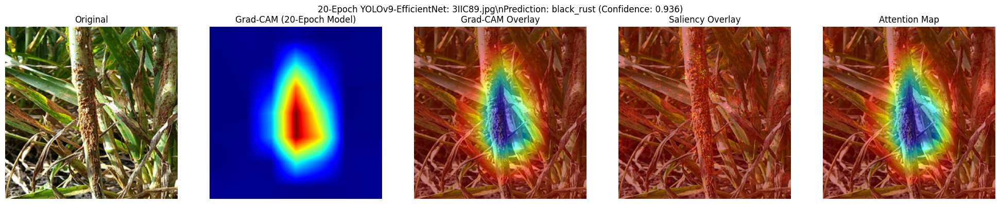

--------------------------------------------------
Processing: 5410641-LGPT.jfif
  Prediction: black_rust (Confidence: 0.974)


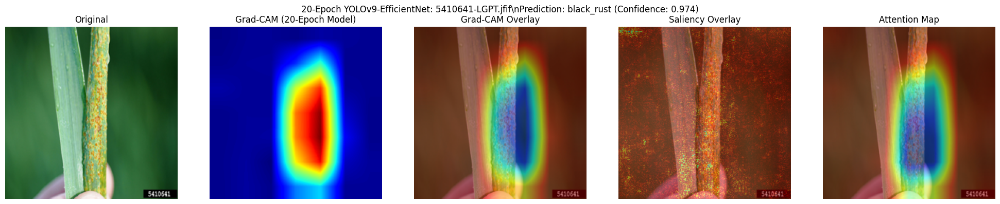

--------------------------------------------------
Processing: AdobeStock_515727101-1.jpeg
  Prediction: black_rust (Confidence: 0.866)


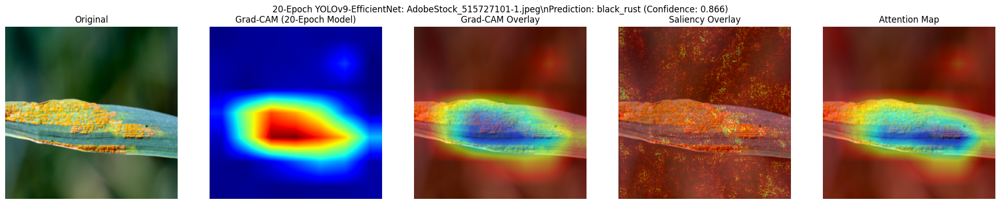

--------------------------------------------------
Processing: af_jun_p36-38_Fusarium_Ear_Blight_Main.jpg
  Prediction: fusarium_head_blight (Confidence: 1.000)


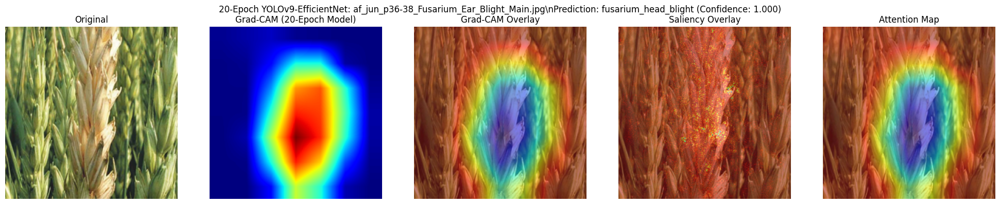

--------------------------------------------------
Processing: brown-rust-wheat_375x225.webp
  Prediction: black_rust (Confidence: 0.922)


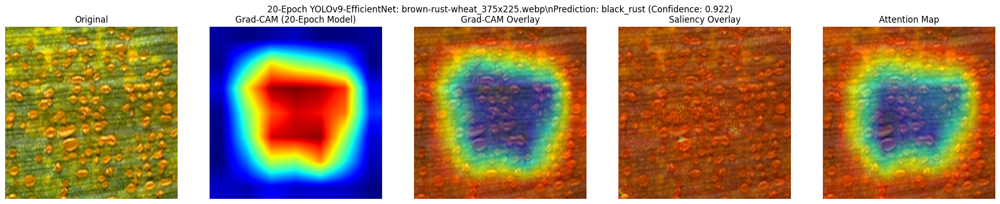

--------------------------------------------------
Processing: brown-rust_wheat_375x225_halfwidth.webp
  Prediction: black_rust (Confidence: 0.987)


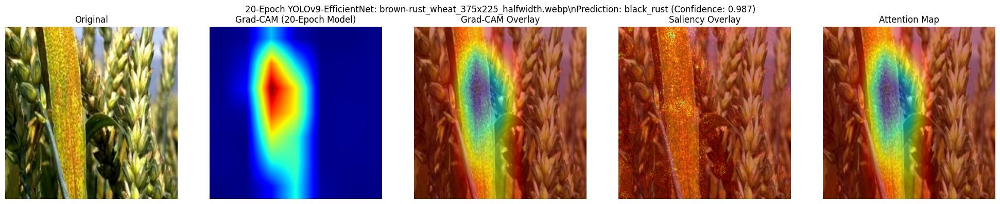

--------------------------------------------------
Processing: close-up-of-typical-lesion-with-black-pycndidia_340x204.webp
  Prediction: leaf_blight (Confidence: 0.656)


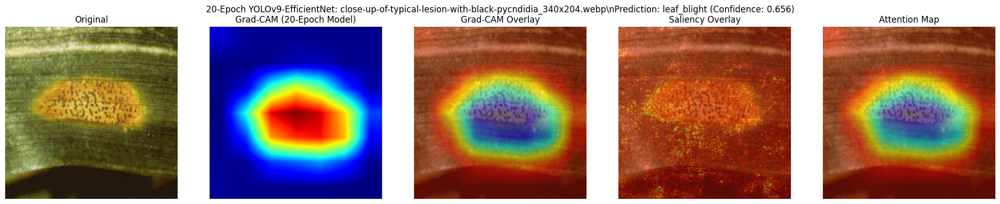

--------------------------------------------------
Processing: D-SG-PREC-FO.003banner.png
  Prediction: common_rust (Confidence: 0.673)


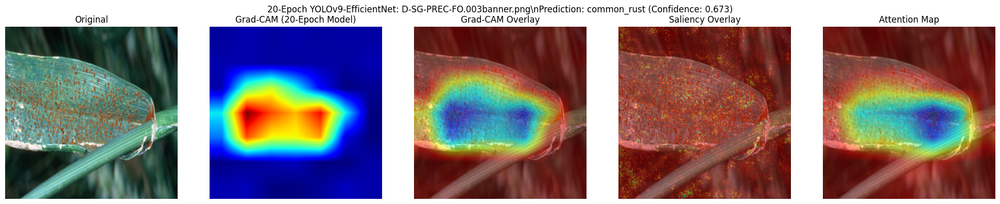

--------------------------------------------------
Processing: Hero Banners_Cereal Disease Hub_920x665.jpg
  Prediction: leaf_blight (Confidence: 0.651)


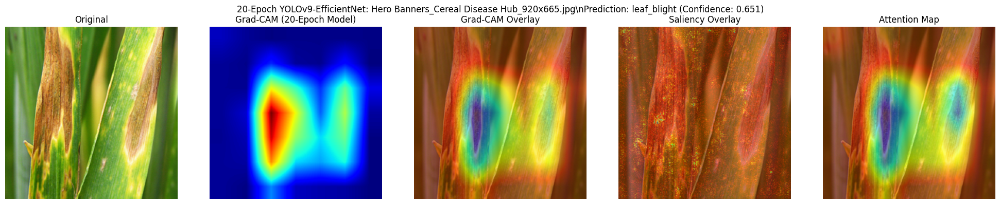

--------------------------------------------------
Processing: leaf-blight-main-im.png.webp
  Prediction: tan_spot (Confidence: 0.457)


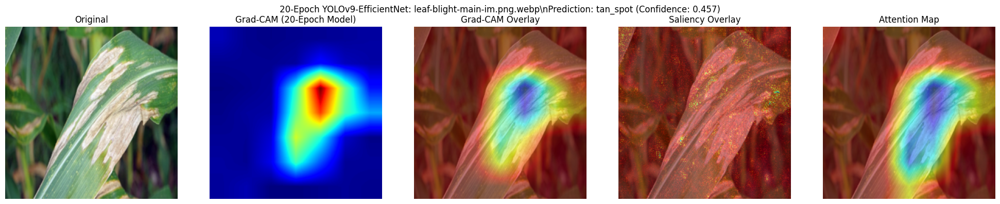

--------------------------------------------------
Processing: lovepik-newborn-winter-wheat-picture_501700878.jpg
  Prediction: fusarium_head_blight (Confidence: 0.925)


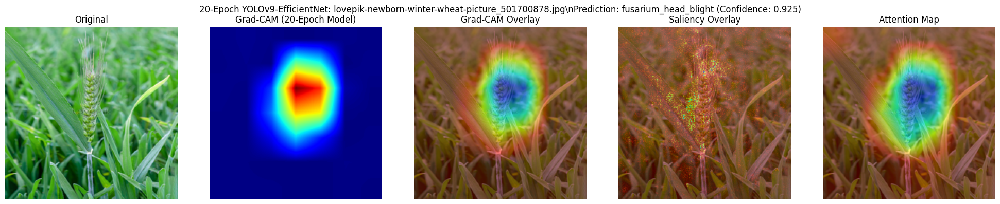

--------------------------------------------------
Processing: mildew-later_340x204.webp
  Prediction: tan_spot (Confidence: 0.837)


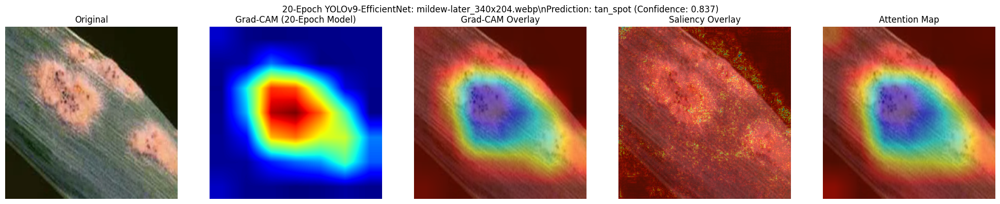

--------------------------------------------------
Processing: test.png
  Prediction: healthy (Confidence: 1.000)


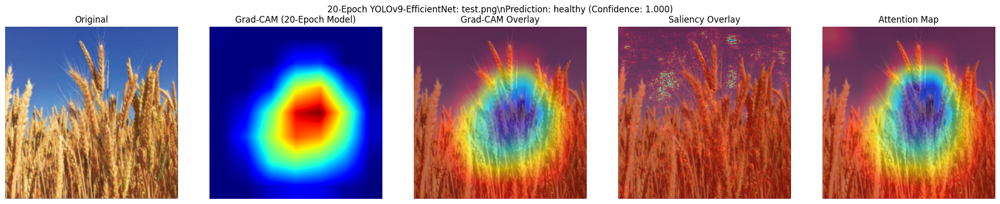

--------------------------------------------------
Processing: true-fusarium-field-infection.webp
  Prediction: fusarium_head_blight (Confidence: 0.939)


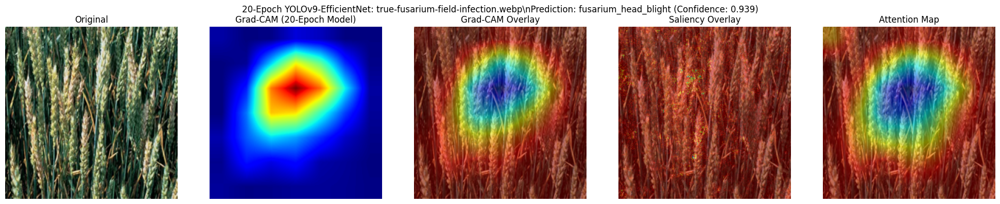

--------------------------------------------------
Processing: W-00261-01-wheat-streak-mosaic-virus.jpg
  Prediction: tan_spot (Confidence: 0.696)


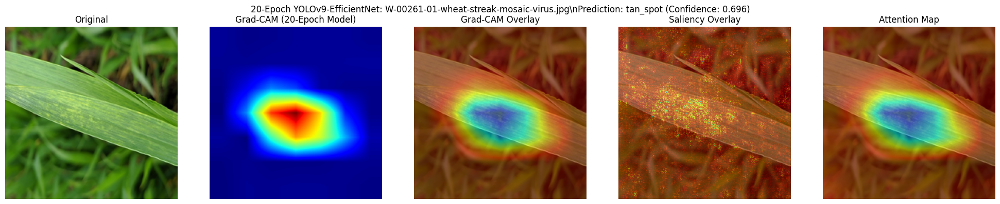

--------------------------------------------------
Processing: Wheat-Tunnel-green-emerged-ear-x2-close-up-1024x768.jpg
  Prediction: aphid (Confidence: 0.587)


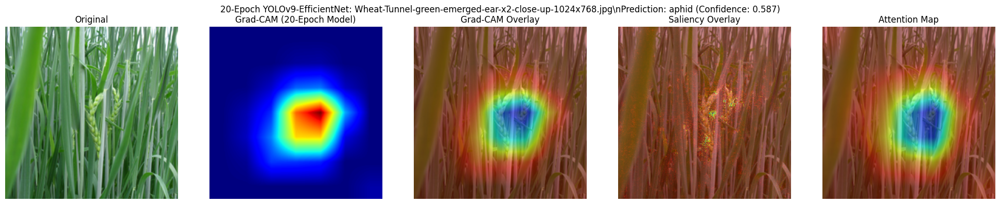

--------------------------------------------------
Processing: yellow_rust_close_375x225.webp
  Prediction: leaf_blight (Confidence: 0.752)


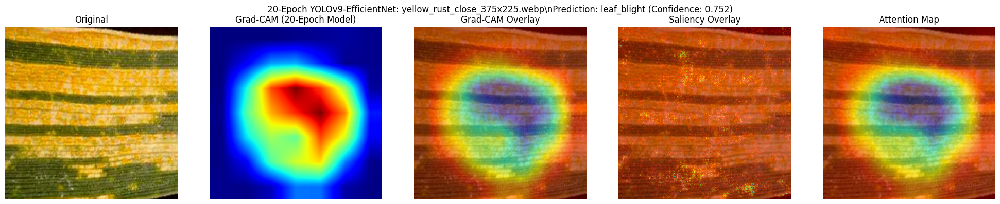

--------------------------------------------------
🎉 20-Epoch YOLOv9-EfficientNet inference complete!
📊 Model achieved 89.52% test accuracy after 20 epochs of training!


In [1]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import sys

# Add the train_scripts directory to path to import YOLO
sys.path.append('../train_scripts')
try:
    from ultralytics import YOLO
except ImportError:
    print("Installing ultralytics...")
    os.system(f"{sys.executable} -m pip install ultralytics")
    from ultralytics import YOLO

# Paths - Updated to use 20-epoch trained model
MODEL_PATH = '../saved_models_and_data/hybrid_yolov9_efficientnet_model.pth'  # 20-epoch trained model
DATASET_DIR = '../dataset'
TEST_IMAGES_DIR = '../test_images'
IMAGE_SIZE = (224, 224)


class HybridYOLOv9EfficientNet(nn.Module):
    """Hybrid model combining YOLOv9 for detection and EfficientNet-B3 for classification"""
    def __init__(self, num_classes, pretrained=True):
        super(HybridYOLOv9EfficientNet, self).__init__()
        
        # YOLOv9 backbone for feature extraction and detection
        # Use a proper PyTorch YOLO model that can be loaded with state_dict
        self.yolo_backbone = YOLO('yolov9c.pt')
        
        # EfficientNet-B3 for classification
        self.efficientnet = models.efficientnet_b3(pretrained=pretrained)
        
        # Modify EfficientNet classifier for our number of classes
        num_features = self.efficientnet.classifier[1].in_features
        self.efficientnet.classifier[1] = nn.Linear(num_features, num_classes)
        
        # Feature fusion layer
        self.feature_fusion = nn.Sequential(
            nn.Linear(num_classes + 512, 256),  # 512 from YOLO features + num_classes from EfficientNet
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )
    
    def forward(self, x):
        batch_size = x.size(0)
        
        # Get YOLO features (detection) - process each image individually
        yolo_features_list = []
        for i in range(batch_size):
            # Process single image
            single_image = x[i:i+1]  # Keep batch dimension
            
            # YOLO expects 0-1 range, so denormalize if needed
            if x.min() < 0 or x.max() > 1:
                # Denormalize from ImageNet stats back to 0-1 range
                mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(x.device)
                std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(x.device)
                single_image = single_image * std + mean
                # Clamp to 0-1 range
                single_image = torch.clamp(single_image, 0, 1)
            
            yolo_result = self.yolo_backbone(single_image, verbose=False)
            
            # Extract features from single image
            if hasattr(yolo_result, 'boxes') and yolo_result.boxes is not None and len(yolo_result.boxes.conf) > 0:
                # Use detection confidence as features
                conf_scores = yolo_result.boxes.conf[:512]  # Limit to 512 features
                if len(conf_scores) < 512:
                    # Pad with zeros if needed
                    padding = torch.zeros(512 - len(conf_scores), device=conf_scores.device)
                    conf_scores = torch.cat([conf_scores, padding])
                yolo_features_list.append(conf_scores)
            else:
                # No detections, use zero features
                yolo_features_list.append(torch.zeros(512, device=x.device))
        
        # Stack all YOLO features into batch
        yolo_feat = torch.stack(yolo_features_list)  # Shape: (batch_size, 512)
        
        # Get EfficientNet classification (uses normalized input)
        efficientnet_out = self.efficientnet(x)
        
        # Combine features - ensure both have same dimensions
        combined_features = torch.cat([efficientnet_out, yolo_feat], dim=1)
        
        # Final classification
        output = self.feature_fusion(combined_features)
        
        return output
    
    def train(self, mode=True):
        """Custom train method to handle YOLO object"""
        # Set EfficientNet to training mode
        self.efficientnet.train(mode)
        # Set feature fusion layers to training mode
        self.feature_fusion.train(mode)
        # YOLO object doesn't need train mode setting
        return self
    
    def eval(self):
        """Custom eval method to handle YOLO object"""
        # Set EfficientNet to eval mode
        self.efficientnet.eval()
        # Set feature fusion layers to eval mode
        self.feature_fusion.eval()
        # YOLO object doesn't need eval mode setting
        return self


def get_class_labels(dataset_dir):
    return sorted([d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))])

class_labels = get_class_labels(DATASET_DIR)
test_transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),  # This converts PIL image (0-255) to tensor (0-1)
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the hybrid model
print("Initializing YOLOv9-EfficientNet hybrid model...")
model = HybridYOLOv9EfficientNet(num_classes=len(class_labels))

# Check if model file exists
if os.path.exists(MODEL_PATH):
    print(f"✅ Loading 20-epoch trained YOLOv9-EfficientNet model from: {MODEL_PATH}")
    print("📊 Model Performance:")
    print("   • Test Accuracy: 89.52%")
    print("   • Best Validation Accuracy: 90.39%")
    print("   • Training completed: 20 epochs")
    print("   • Training time: 60.1 minutes")
    
    # Load state dict with strict=False to handle YOLO keys
    try:
        state_dict = torch.load(MODEL_PATH, map_location=device)
        print(f"Loaded state dict with {len(state_dict)} keys")
        
        # Filter out YOLO-related keys that we can't load
        filtered_state_dict = {}
        for key, value in state_dict.items():
            if not key.startswith('yolo_backbone.'):
                filtered_state_dict[key] = value
        
        print(f"Filtered state dict has {len(filtered_state_dict)} keys")
        
        # Load the filtered state dict
        missing_keys, unexpected_keys = model.load_state_dict(filtered_state_dict, strict=False)
        print(f"Missing keys: {len(missing_keys)}")
        print(f"Unexpected keys: {len(unexpected_keys)}")
        
    except Exception as e:
        print(f"Error loading model: {e}")
        print("Creating model without loading weights...")
    
    print("✅ 20-epoch YOLOv9-EfficientNet model loaded successfully!")
else:
    print(f"❌ 20-epoch model file not found at: {MODEL_PATH}")
    print("Please run the training script first to generate the model.")
    print("Available model files:")
    # List available models
    if os.path.exists('../saved_models_and_data'):
        for file in os.listdir('../saved_models_and_data'):
            if file.endswith('.pth'):
                print(f"  - {file}")
    else:
        print("  No saved_models_and_data directory found.")

model = model.to(device)
model.eval()
print(f"Model moved to device: {device}")
print("="*60)


class HybridGradCAM:
    """Enhanced GradCAM for hybrid YOLOv9-EfficientNet model"""
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()
    
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        
        # Hook EfficientNet features (main classifier)
        efficientnet_layer = self.model.efficientnet.features[-1]
        self.hook_handles.append(efficientnet_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(efficientnet_layer.register_backward_hook(backward_hook))
    
    def __call__(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()
        loss = output[0, class_idx]
        loss.backward()
        
        gradients = self.gradients[0]
        activations = self.activations[0]
        weights = gradients.mean(dim=(1, 2))
        cam = (weights[:, None, None] * activations).sum(dim=0)
        cam = torch.relu(cam)
        cam = cam.cpu().numpy()
        cam = cv2.resize(cam, IMAGE_SIZE)
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam
    
    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()


def compute_saliency_map(model, input_tensor, class_idx=None):
    input_tensor = input_tensor.clone().detach().requires_grad_(True)
    model.zero_grad()
    output = model(input_tensor)
    if class_idx is None:
        class_idx = output.argmax(dim=1).item()
    loss = output[0, class_idx]
    loss.backward()
    saliency = input_tensor.grad.data.abs().squeeze().cpu().numpy()
    saliency = np.max(saliency, axis=0)
    saliency = cv2.resize(saliency, IMAGE_SIZE)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency


def compute_attention_map(model, input_tensor):
    with torch.no_grad():
        features = None
        def hook_fn(module, input, output):
            nonlocal features
            features = output.detach()
        # Use EfficientNet-B3 features for attention map
        handle = model.efficientnet.features[-1].register_forward_hook(hook_fn)
        _ = model(input_tensor)
        handle.remove()
        attn_map = features.mean(dim=1).squeeze().cpu().numpy()
        attn_map = cv2.resize(attn_map, IMAGE_SIZE)
        attn_map = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)
        return attn_map


def show_cam_on_image(img: np.ndarray, mask: np.ndarray, alpha=0.5):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)


# Use enhanced hybrid GradCAM
gradcam = HybridGradCAM(model)

print(f"Starting YOLOv9-EfficientNet inference on {len(os.listdir(TEST_IMAGES_DIR))} test images...")
print("="*70)

for img_name in os.listdir(TEST_IMAGES_DIR):
    if not img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.webp', '.jfif')):
        continue
        
    img_path = os.path.join(TEST_IMAGES_DIR, img_name)
    print(f"Processing: {img_name}")
    
    try:
        img_pil = Image.open(img_path).convert('RGB')
        img_tensor = test_transform(img_pil).unsqueeze(0).to(device)
        
        with torch.no_grad():
            output = model(img_tensor)
            prob = torch.softmax(output, dim=1)[0]
            pred_idx = prob.argmax().item()
            pred_label = class_labels[pred_idx]
            pred_prob = prob[pred_idx].item()
        
        print(f"  Prediction: {pred_label} (Confidence: {pred_prob:.3f})")
        
        # Generate visualizations
        cam = gradcam(img_tensor, class_idx=pred_idx)
        saliency = compute_saliency_map(model, img_tensor, class_idx=pred_idx)
        attn_map = compute_attention_map(model, img_tensor)
        
        img_np = np.array(img_pil.resize(IMAGE_SIZE)).astype(np.float32) / 255.0
        cam_img = show_cam_on_image(img_np, cam)
        sal_img = show_cam_on_image(img_np, saliency)
        attn_img = show_cam_on_image(img_np, attn_map)
        
        # Display results
        plt.figure(figsize=(20, 4))
        plt.subplot(1, 5, 1)
        plt.imshow(img_pil.resize(IMAGE_SIZE))
        plt.title('Original')
        plt.axis('off')
        
        plt.subplot(1, 5, 2)
        plt.imshow(cam, cmap='jet')
        plt.title('Grad-CAM (20-Epoch Model)')
        plt.axis('off')
        
        plt.subplot(1, 5, 3)
        plt.imshow(cam_img)
        plt.title('Grad-CAM Overlay')
        plt.axis('off')
        
        plt.subplot(1, 5, 4)
        plt.imshow(sal_img)
        plt.title('Saliency Overlay')
        plt.axis('off')
        
        plt.subplot(1, 5, 5)
        plt.imshow(attn_img)
        plt.title('Attention Map')
        plt.axis('off')
        
        plt.suptitle(f'20-Epoch YOLOv9-EfficientNet: {img_name}\\nPrediction: {pred_label} (Confidence: {pred_prob:.3f})')
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"  Error processing {img_name}: {e}")
        continue
    
    print("-" * 50)

print("🎉 20-Epoch YOLOv9-EfficientNet inference complete!")
print("📊 Model achieved 89.52% test accuracy after 20 epochs of training!")
